In [2]:
%pip install zipline-reloaded
%pip install quandl
%pip install pyfolio-reloaded

In [13]:
from zipline import run_algorithm
from zipline.api import (
    attach_pipeline,
    calendars,
    pipeline_output,
    date_rules,
    time_rules,
    set_commission,
    set_slippage,
    order_target_percent,
    get_open_orders,
    schedule_function
)
from datetime import datetime
import pytz
import pyfolio as pf
import matplotlib.pyplot as plt
import quandl
import pandas as pd
import zipline

In [14]:
import os

from google.colab import userdata
# Set environment variable for Quandl
os.environ['QUANDL_API_KEY'] = userdata.get('QUANDL_API_KEY')

In [15]:
!zipline ingest -b quandl

[2025-11-09T18:19:26+0000-INFO][zipline.data.bundles.core]
 Ingesting quandl
[2025-11-09T18:19:26+0000-INFO][zipline.data.bundles.quandl]
[2025-11-09T18:19:40+0000-INFO][zipline.data.bundles.quandl]
 Parsing raw data.
[2025-11-09T18:20:01+0000-INFO][zipline.data.bundles.quandl]
 Generating asset metadata.
/usr/local/lib/python3.12/dist-packages/zipline/data/bundles/quandl.py:107: FutureWarning: The provided callable <function min at 0x7a86191d8cc0> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  data = data.groupby(by="symbol").agg({"date": [np.min, np.max]})
/usr/local/lib/python3.12/dist-packages/zipline/data/bundles/quandl.py:107: FutureWarning: The provided callable <function max at 0x7a86191d8b80> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" ins

In [16]:
# Create a working bundle directly in the notebook
import pandas as pd
import yfinance as yf
from zipline.data.bundles import register

# Full ticker list matching your trading universe
bundle_tickers = [
    'AAPL', 'WMT', 'XOM', 'GOOGL', 'MSFT', 'NVDA', 'AMD', 'INTC', 'ORCL',
    'BIDU', 'COST', 'PG', 'KO', 'PEP', 'CME', 'AVGO', 'JNJ', 'HD',
    'EQIX', 'ABBV', 'SCHD', 'PFF', 'VWO', 'VEA', 'GLD', 'FXY', 'FXE', 'VNQ', 'TLT',
    'SPY', 'QQQ', 'IEF', 'BRK-A'  # Benchmarks
]

def custom_bundle_ingestion(environ,
                             asset_db_writer,
                             minute_bar_writer,
                             daily_bar_writer,
                             adjustment_writer,
                             calendar,
                             start_session,
                             end_session,
                             cache,
                             show_progress,
                             output_dir):
    """
    Custom bundle ingestion function compatible with Zipline's requirements.
    """
    print(f"Starting ingestion for {len(bundle_tickers)} tickers...")
    print(f"Date range: {start_session} to {end_session}")

    try:
        # Download data
        print("\nDownloading data from Yahoo Finance...")
        data = yf.download(
            bundle_tickers,
            start=start_session,
            end=end_session + pd.Timedelta(days=1),
            auto_adjust=False,
            group_by='ticker',
            progress=show_progress
        )
        print("✓ Download complete")

        # Prepare metadata and data for writing
        metadata = []
        daily_bar_data = {}

        print("\nProcessing ticker data...")
        for ticker in bundle_tickers:
            try:
                if len(bundle_tickers) == 1:
                    df = data.copy()
                else:
                    df = data[ticker].copy()

                # Rename columns to what Zipline expects
                df = df.rename(columns={
                    'Open': 'open',
                    'High': 'high',
                    'Low': 'low',
                    'Close': 'close',
                    'Volume': 'volume',
                })

                # Use Adj Close as the close price
                if 'Adj Close' in df.columns:
                    df['close'] = df['Adj Close']

                df = df[['open', 'high', 'low', 'close', 'volume']].dropna()

                if df.empty:
                    print(f"  ⚠ Skipping {ticker}: no data")
                    continue

                # Add metadata with proper types
                metadata.append({
                    'symbol': ticker,
                    'asset_name': ticker,
                    'start_date': df.index[0].to_pydatetime(),
                    'end_date': df.index[-1].to_pydatetime(),
                    'first_traded': df.index[0].to_pydatetime(),
                    'auto_close_date': (df.index[-1] + pd.Timedelta(days=1)).to_pydatetime(),
                    'exchange': 'NYSE',
                })

                daily_bar_data[ticker] = df
                print(f"  ✓ {ticker}: {len(df)} bars from {df.index[0].date()} to {df.index[-1].date()}")

            except Exception as e:
                print(f"  ✗ {ticker}: {e}")
                import traceback
                traceback.print_exc()

        if not metadata:
            raise ValueError("No valid ticker data found!")

        # Write metadata FIRST to get asset IDs
        print("\nWriting asset metadata...")
        metadata_df = pd.DataFrame(metadata)
        asset_db_writer.write(equities=metadata_df)
        print(f"✓ Wrote metadata for {len(metadata)} assets")

        # Get the asset IDs from the asset_db_writer
        # The asset_db_writer assigns sequential IDs starting from 0
        symbol_to_sid = {row['symbol']: idx for idx, row in metadata_df.iterrows()}

        # Write daily bars with proper asset IDs
        print("\nWriting daily bar data...")
        # Convert to list of (sid, dataframe) tuples
        daily_bar_data_with_sids = [
            (symbol_to_sid[symbol], df)
            for symbol, df in daily_bar_data.items()
        ]
        daily_bar_writer.write(daily_bar_data_with_sids, show_progress=show_progress)
        print("✓ Daily bars written")

        # Write adjustments (empty for now)
        print("\nWriting adjustments...")
        adjustment_writer.write()
        print("✓ Adjustments written")

        print(f"\n{'='*50}")
        print(f"✓ Bundle ingestion complete: {len(metadata)} assets")
        print(f"{'='*50}")

    except Exception as e:
        print(f"\n✗ ERROR during ingestion: {e}")
        import traceback
        traceback.print_exc()
        raise

# Register the bundle
register(
    'etf-bundle',
    custom_bundle_ingestion,
    calendar_name='NYSE',
)

print("✓ Bundle 'etf-bundle' registered successfully")
print(f"  Tickers: {len(bundle_tickers)} total")
print(f"  Ready to ingest")

✓ Bundle 'etf-bundle' registered successfully
  Tickers: 33 total
  Ready to ingest


/tmp/ipython-input-1920352004.py:133: UserWarning: Overwriting bundle with name 'etf-bundle'
  register(


In [17]:
# Ingest the bundle data directly (not via shell command)
from zipline.data.bundles import ingest
import os

print("Starting bundle ingestion...")
print(f"Working directory: {os.getcwd()}")

try:
    # Ingest using Python API instead of shell command
    ingest('etf-bundle', show_progress=True)
    print("\n✓ Bundle ingestion completed successfully")
except Exception as e:
    print(f"\n✗ Error during ingestion: {e}")
    import traceback
    traceback.print_exc()

Starting bundle ingestion...
Working directory: /content
Starting ingestion for 33 tickers...
Date range: 1990-01-02 00:00:00 to 2026-11-09 00:00:00



[*********************100%***********************]  33 of 33 completed


✓ Download complete

Processing ticker data...
  ✓ AAPL: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ WMT: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ XOM: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ GOOGL: 5341 bars from 2004-08-19 to 2025-11-07
  ✓ MSFT: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ NVDA: 6742 bars from 1999-01-22 to 2025-11-07
  ✓ AMD: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ INTC: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ ORCL: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ BIDU: 5098 bars from 2005-08-05 to 2025-11-07
  ✓ COST: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ PG: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ KO: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ PEP: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ CME: 5768 bars from 2002-12-06 to 2025-11-07
  ✓ AVGO: 4091 bars from 2009-08-06 to 2025-11-07
  ✓ JNJ: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ HD: 9031 bars from 1990-01-02 to 2025-11-07
  ✓ EQIX: 6349 bars from 2000-08-11 to 2025-11-07
  ✓ ABBV: 3234

/usr/local/lib/python3.12/dist-packages/zipline/data/bcolz_daily_bars.py:341: UserWarning: Ignoring 1 values because they are out of bounds for uint32:
 Price           open      high       low     close      volume
Date                                                          
2000-09-29  0.503348  0.517857  0.453125  0.386509  7421640800
  winsorise_uint32(raw_data, invalid_data_behavior, "volume", *OHLC)
/usr/local/lib/python3.12/dist-packages/zipline/data/bcolz_daily_bars.py:341: UserWarning: Ignoring 4 values because they are out of bounds for uint32:
 Price           open      high       low     close        volume
Date                                                            
2001-11-29  0.459083  0.461417  0.445000  0.409618  5.135472e+09
2002-07-31  0.098500  0.100500  0.091167  0.084583  4.837140e+09
2003-05-09  0.156917  0.179417  0.152500  0.163282  9.230856e+09
2004-08-06  0.084250  0.085000  0.077500  0.072052  5.088948e+09
  winsorise_uint32(raw_data, invalid_data_beha

✓ Adjustments written

✓ Bundle ingestion complete: 33 assets

✓ Bundle ingestion completed successfully


In [18]:
# Verify bundle data is accessible
from zipline.data import bundles

try:
    bundle_data = bundles.load('etf-bundle')
    print("✓ Bundle 'etf-bundle' loaded successfully")

    # Check available assets
    assets = bundle_data.asset_finder.retrieve_all(bundle_data.asset_finder.sids)
    print(f"✓ Found {len(assets)} assets in bundle")

    # Check if our tickers are available
    print(f"\nChecking your tickers:")
    for ticker in tickers:
        try:
            asset = bundle_data.asset_finder.lookup_symbol(ticker, None)
            print(f"  ✓ {ticker} (sid: {asset.sid})")
        except Exception as e:
            print(f"  ✗ {ticker} NOT FOUND: {e}")

except Exception as e:
    print(f"✗ Error loading bundle: {e}")
    print("\nPlease run the previous cells to register and ingest the bundle first.")

✓ Bundle 'etf-bundle' loaded successfully
✓ Found 33 assets in bundle

Checking your tickers:
  ✓ AAPL (sid: 0)
  ✓ WMT (sid: 1)
  ✓ XOM (sid: 2)
  ✓ GOOGL (sid: 3)
  ✓ MSFT (sid: 4)
  ✓ NVDA (sid: 5)
  ✓ AMD (sid: 6)
  ✓ INTC (sid: 7)
  ✓ ORCL (sid: 8)
  ✓ CME (sid: 14)
  ✓ AVGO (sid: 15)
  ✓ WMT (sid: 1)
  ✓ JNJ (sid: 16)
  ✓ XOM (sid: 2)


In [22]:
start = pd.Timestamp('2016-01-01')
end = pd.Timestamp('2025-10-31')
live_start_date = '2020-02-27'

tickers = ['AAPL', 'WMT', 'XOM',
            # 'GOOGL', 'MSFT', 'NVDA', 'AMD', 'INTC', 'ORCL',
            # 'BIDU',
            # 'COST', 'PG', 'KO', 'PEP',
            # 'CME', 'AVGO', 'WMT', 'JNJ', 'XOM',
            # 'HD',
            # 'EQIX',
            # 'ABBV', 'SCHD', 'PFF', 'VWO', 'VEA', 'GLD', 'FXY','FXE','VNQ', 'TLT',
            ]

In [23]:
# basic strategy
from zipline.api import symbol, schedule_function, date_rules, time_rules, order_target_percent

def initialize(context):
    context.universe = [symbol(s) for s in tickers]
    # History window
    context.history_window = 20

    # Size of our portfolio
    context.stocks_to_hold = 10

    # Schedule the daily trading routine for once per month
    schedule_function(handle_data, date_rules.month_start(), time_rules.market_close())

def month_perf(ts):
    perf = (ts[-1] / ts[0]) - 1
    return perf

def handle_data(context, data):
    # Get history for all the stocks.
    hist = data.history(context.universe, "close", context.history_window, "1d")

    # This creates a table of percent returns, in order.
    perf_table = hist.apply(month_perf).sort_values(ascending=False)

    # Make buy list of the top N stocks
    buy_list = perf_table[:context.stocks_to_hold]

    # The rest will not be held.
    the_rest = perf_table[context.stocks_to_hold:]

    # Place target buy orders for top N stocks.
    for stock, perf in buy_list.items():
        stock_weight = 1 / context.stocks_to_hold

        # Place order
        if data.can_trade(stock):
            order_target_percent(stock, stock_weight)

    # Make sure we are flat the rest.
    for stock, perf in the_rest.items():
        # Place order
        if data.can_trade(stock):
            order_target_percent(stock, 0.0)

def analyze(context, perf):
    fig = plt.figure(figsize=(12, 8))

    # First chart
    ax = fig.add_subplot(311)
    ax.set_title('Strategy Results')
    ax.plot(perf.index, perf['portfolio_value'], linestyle='-',
                label='Equity Curve', linewidth=3.0)


    ax.legend()
    ax.grid(False)

    # Second chart
    ax = fig.add_subplot(312)
    ax.plot(perf.index, perf['gross_leverage'],
            label='Exposure', linestyle='-', linewidth=1.0)
    ax.legend()
    ax.grid(True)

    #Use PyFolio to generate a performance report
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf)
    pf.create_full_tear_sheet(returns, positions=positions, transactions=transactions,
                          live_start_date=live_start_date, round_trips=True)

/tmp/ipython-input-1769851921.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  perf = (ts[-1] / ts[0]) - 1
/tmp/ipython-input-1769851921.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  perf = (ts[-1] / ts[0]) - 1
/usr/local/lib/python3.12/dist-packages/empyrical/stats.py:393: RuntimeWarning: invalid value encountered in scalar power
  return ending_value ** (1 / num_years) - 1
/usr/local/lib/python3.12/dist-packages/empyrical/stats.py:393: RuntimeWarning: invalid value encountered in scalar power
  return ending_value ** (1 / num_years) - 1
/usr/local/lib/python3.12/dist-packages/empyrical/stats.py:1392: Run

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,15585.79,2020-06-08,2021-06-23,NaT,NaN
1,4247.04,2019-04-26,2019-08-09,2019-08-15,80
2,3508.59,2019-10-28,2020-05-28,2020-06-05,160
3,132.98,2019-08-22,2019-09-05,2019-09-09,13
4,114.24,2019-09-09,2019-09-12,2019-09-16,6


/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:850: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  starting_value=is_cum_returns[-1],
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:850: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  starting_value=is_cum_returns[-1],
/usr/local/lib/python3.12/dist-packages/matplotlib/dates.py:449: UserWarning: no explicit representation of timezones available for np.datetime64
  d = d.astype('datetime64[us]')
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:1407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. af

Stress Events,mean,min,max
Covid,3.08%,-489.95%,919.39%


Top 10 long positions of all time,max
sid,
WMT,188224.41%
XOM,73209.54%
JNJ,773.92%
ORCL,553.82%
AVGO,426.36%
GOOGL,355.67%
CME,272.59%
AAPL,269.05%
MSFT,267.62%


Top 10 short positions of all time,max
sid,
WMT,-57124.40%
XOM,-22896.33%
AMD,-2071.46%
GOOGL,-355.52%
CME,-205.04%
ORCL,-173.62%
INTC,-173.44%
AVGO,-166.91%
MSFT,-166.07%


Top 10 positions of all time,max
sid,
WMT,188224.41%
XOM,73209.54%
AMD,2071.46%
JNJ,773.92%
ORCL,553.82%
AVGO,426.36%
GOOGL,355.67%
CME,272.59%
AAPL,269.05%


/usr/local/lib/python3.12/dist-packages/pyfolio/pos.py:100: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  longs = expos.where(expos.applymap(lambda x: x > 0))
/usr/local/lib/python3.12/dist-packages/pyfolio/pos.py:101: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  shorts = expos.where(expos.applymap(lambda x: x < 0))
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:323: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_holdings_by_month = df_holdings.resample("1M").mean()
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:1465: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_turnover_by_month = df_turnover.resample("M").mean()


Summary stats,All trades,Short trades,Long trades
Total number of round_trips,3198.00,2119.00,1079.00
Percent profitable,0.39,0.32,0.53
Winning round_trips,1245.00,678.00,567.00
Losing round_trips,1953.00,1441.00,512.00
Even round_trips,0.00,0.00,0.00


PnL stats,All trades,Short trades,Long trades
Total profit,$-5388641614.79,$-17803728430.80,$12415086816.00
Gross profit,$15364786120.03,$1374850358.02,$13989935762.01
Gross loss,$-20753427734.82,$-19178578788.82,$-1574848946.00
Profit factor,$0.74,$0.07,$8.88
Avg. trade net profit,$-1685003.63,$-8401948.29,$11506104.56
Avg. winning trade,$12341193.67,$2027802.89,$24673608.05
Avg. losing trade,$-10626435.09,$-13309214.98,$-3075876.85
Ratio Avg. Win:Avg. Loss,$1.16,$0.15,$8.02
Largest winning trade,$9669783076.26,$133577593.26,$9669783076.26
Largest losing trade,$-11112227937.95,$-11112227937.95,$-58427333.84


Duration stats,All trades,Short trades,Long trades
Avg duration,21 days 21:57:49.418073796,19 days 16:23:21.606890042,26 days 07:10:33.914735866
Median duration,10 days 00:00:00,12 days 00:00:00,4 days 00:00:00
Longest duration,442 days 04:00:01,442 days 04:00:01,309 days 03:00:01
Shortest duration,0 days 00:00:00,0 days 00:00:00,0 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,0.26%,0.48%,-0.17%
Avg returns winning,3.86%,3.06%,5.58%
Avg returns losing,-6.18%,-4.51%,-9.00%
Median returns all round_trips,0.02%,0.02%,0.03%
Median returns winning,0.08%,0.06%,0.25%
Median returns losing,-0.14%,-0.10%,-0.28%
Largest winning trade,537.45%,417.98%,537.45%
Largest losing trade,-785.14%,-686.74%,-785.14%


Symbol stats,AAPL,WMT,XOM,GOOGL,MSFT,NVDA,AMD,INTC,ORCL,CME,AVGO,JNJ
Avg returns all round_trips,0.05%,1.54%,0.67%,-0.12%,0.01%,-0.01%,-0.90%,0.07%,0.31%,0.12%,0.21%,0.00%
Avg returns winning,0.17%,15.43%,15.75%,0.25%,0.09%,0.12%,0.21%,0.16%,0.75%,0.37%,0.36%,0.13%
Avg returns losing,-0.34%,-20.96%,-19.17%,-0.54%,-0.20%,-0.36%,-2.95%,-0.25%,-0.09%,-0.30%,-0.15%,-0.12%
Median returns all round_trips,0.02%,0.47%,0.49%,0.00%,0.02%,0.03%,0.02%,0.05%,-0.00%,0.01%,0.01%,0.00%
Median returns winning,0.04%,1.82%,3.30%,0.04%,0.04%,0.05%,0.06%,0.08%,0.06%,0.05%,0.03%,0.02%
Median returns losing,-0.09%,-2.76%,-2.70%,-0.20%,-0.04%,-0.08%,-0.16%,-0.14%,-0.05%,-0.05%,-0.09%,-0.03%
Largest winning trade,16.55%,537.45%,523.86%,18.60%,1.44%,0.99%,3.60%,2.52%,54.49%,13.91%,32.76%,5.72%
Largest losing trade,-10.83%,-686.74%,-785.14%,-4.82%,-5.72%,-15.02%,-211.44%,-1.87%,-0.77%,-8.14%,-1.80%,-2.92%


Profitability (PnL / PnL total) per name,
symbol,
XOM,210.87%
ORCL,43.27%
AVGO,27.57%
INTC,18.08%
CME,12.45%
MSFT,5.02%
AAPL,4.46%
NVDA,4.32%
JNJ,-3.16%


✓ Algorithm completed successfully


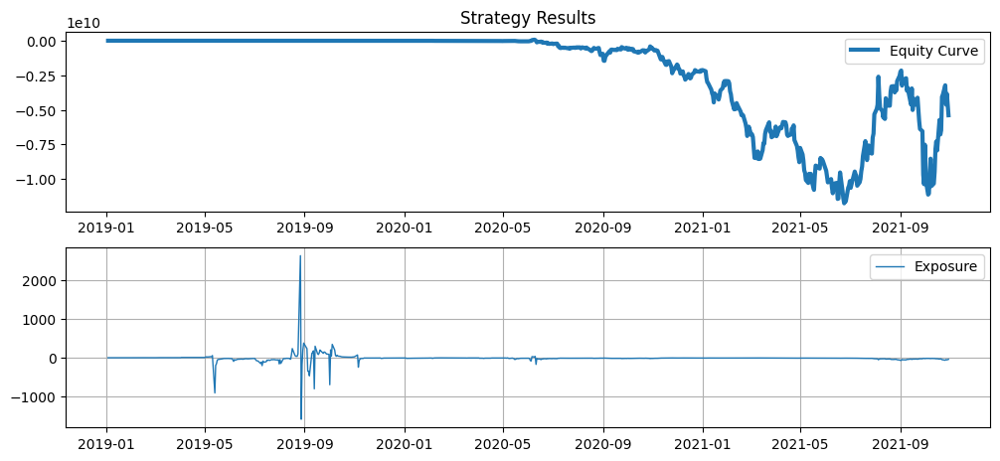

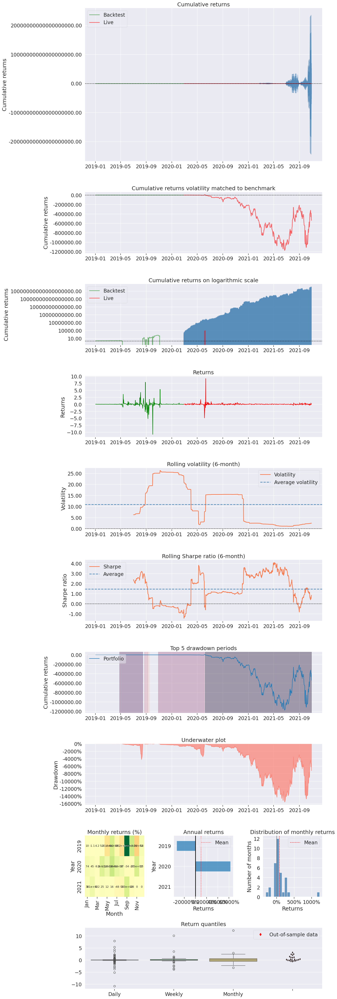

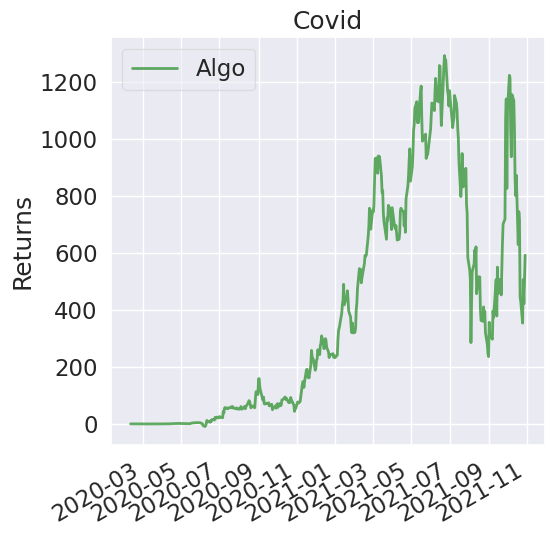

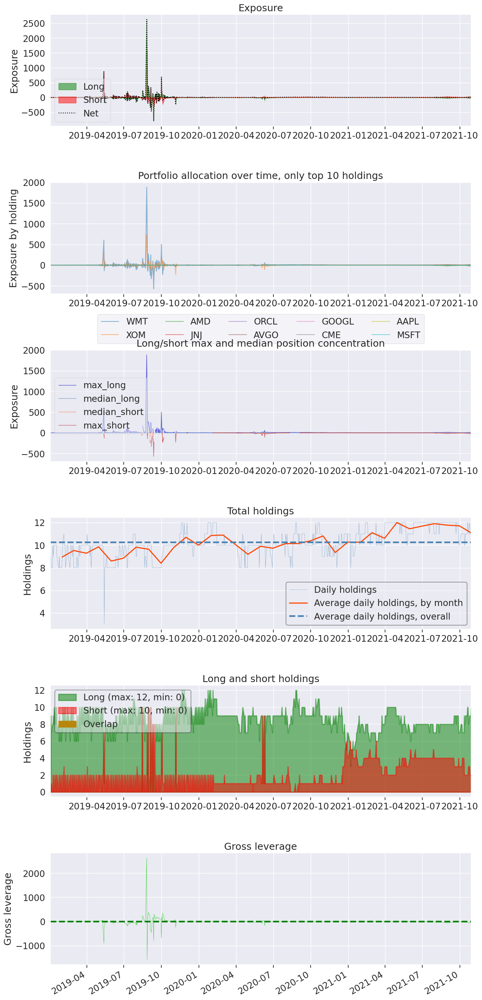

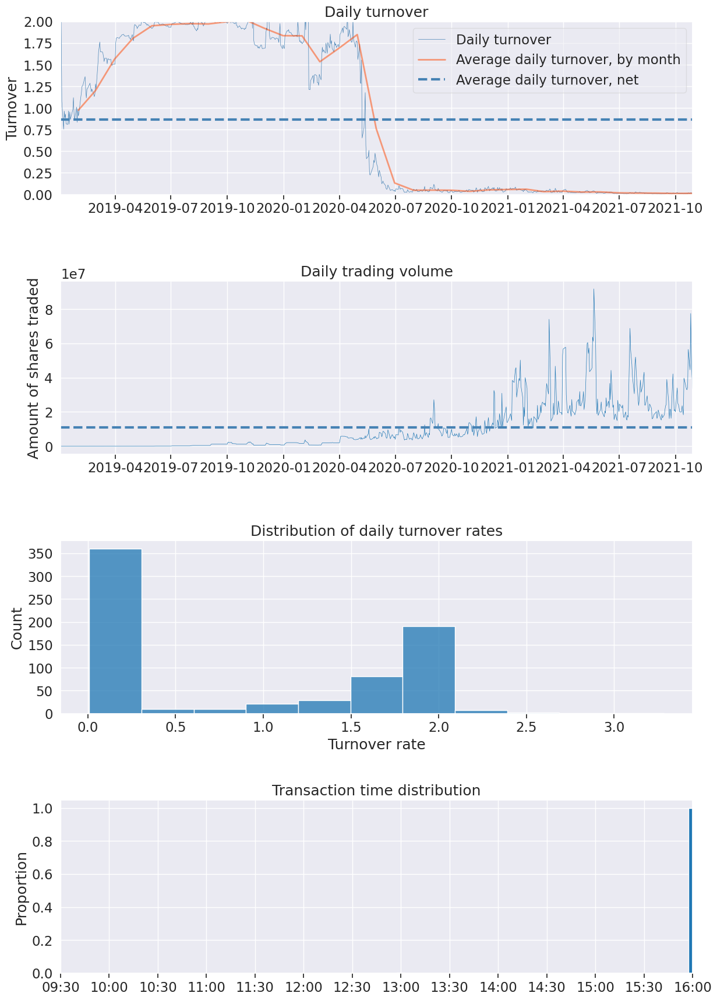

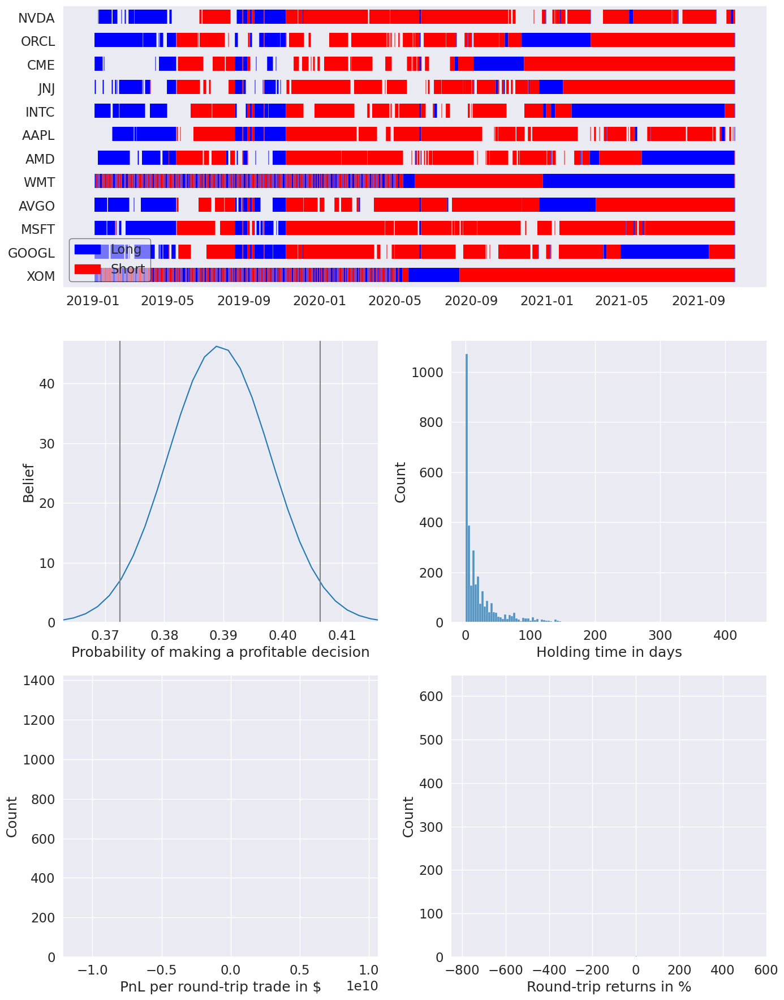

In [11]:
try:
    algo1_momentum_results = run_algorithm(start=start, end=end,
                            initialize=initialize, analyze=analyze,
                            handle_data=handle_data,
                            capital_base=10000,
                            data_frequency = 'daily', bundle='etf-bundle')
    print("✓ Algorithm completed successfully")
except Exception as e:
    print(f"✗ Error running algorithm: {type(e).__name__}")
    print(f"Message: {e}")
    import traceback
    traceback.print_exc()

In [24]:
# moving average strategy
from zipline.api import order_target, record, symbol
from zipline.finance import commission, slippage

def initialize(context):
    context.universe = [symbol(s) for s in tickers]
    context.history_window_long = 300
    context.history_window_short = 100
    context.i = 0

    # Set commission and slippage
    context.set_commission(commission.PerShare(cost=0.0075, min_trade_cost=1.0))
    context.set_slippage(slippage.VolumeShareSlippage())
    schedule_function(handle_data, date_rules.every_day(), time_rules.market_close())


def handle_data(context, perf):
    # Skip first 300 days to get full windows
    context.i += 1
    if context.i < 300:
        return
    rebalance(context, perf)

def rebalance(context, perf):
    for asset in context.universe:
        if not perf.can_trade(asset):
            continue

        short_mavg = perf.history(asset, 'price', context.history_window_short, '1d').mean()
        long_mavg = perf.history(asset, 'price', context.history_window_long, '1d').mean()

        if short_mavg > long_mavg:
            weight = 1.0 / len(context.universe)
            order_target_percent(asset, weight)
        elif short_mavg < long_mavg:
            order_target_percent(asset, 0.0)

def analyze(context, perf):
    import matplotlib.pyplot as plt

    fig = plt.figure()
    ax1 = fig.add_subplot(211)
    perf['portfolio_value'].plot(ax=ax1)
    ax1.set_ylabel("Portfolio value (USD)")

    plt.show()
    #Use PyFolio to generate a performance report
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf)
    pf.create_full_tear_sheet(returns, positions=positions, transactions=transactions,
                          live_start_date=live_start_date, round_trips=True)

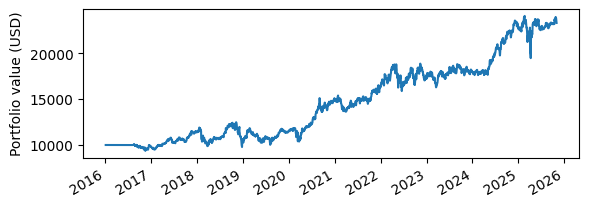

/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '3.022%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '13.599%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '9.008%' has dtype incompatible with float64, please explicitly cast to a compatible d

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,21.65,2018-11-07,2018-12-24,2020-07-07,435
1,19.12,2025-02-19,2025-04-08,NaT,NaN
2,17.08,2018-01-18,2018-03-23,2018-08-29,160
3,15.50,2022-05-04,2022-06-17,2022-11-11,138
4,13.70,2022-11-11,2023-03-17,2024-05-16,395


/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:850: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  starting_value=is_cum_returns[-1],
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:850: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  starting_value=is_cum_returns[-1],
/usr/local/lib/python3.12/dist-packages/matplotlib/dates.py:449: UserWarning: no explicit representation of timezones available for np.datetime64
  d = d.astype('datetime64[us]')
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:1407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. af

Stress Events,mean,min,max
New Normal,0.03%,-6.54%,3.68%
Covid,0.05%,-6.60%,9.63%


Top 10 long positions of all time,max
sid,
XOM,102.76%
AAPL,99.60%
WMT,98.82%


Top 10 short positions of all time,max
sid,
AAPL,-45.28%
XOM,-42.71%
WMT,-37.78%


Top 10 positions of all time,max
sid,
XOM,102.76%
AAPL,99.60%
WMT,98.82%


/usr/local/lib/python3.12/dist-packages/pyfolio/pos.py:100: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  longs = expos.where(expos.applymap(lambda x: x > 0))
/usr/local/lib/python3.12/dist-packages/pyfolio/pos.py:101: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  shorts = expos.where(expos.applymap(lambda x: x < 0))
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:323: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_holdings_by_month = df_holdings.resample("1M").mean()
/usr/local/lib/python3.12/dist-packages/pyfolio/plotting.py:1465: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_turnover_by_month = df_turnover.resample("M").mean()


Summary stats,All trades,Short trades,Long trades
Total number of round_trips,2342.00,618.00,1724.00
Percent profitable,0.61,0.48,0.66
Winning round_trips,1432.00,299.00,1133.00
Losing round_trips,910.00,319.00,591.00
Even round_trips,0.00,0.00,0.00


PnL stats,All trades,Short trades,Long trades
Total profit,$20259.31,$-1950.54,$22209.85
Gross profit,$61256.61,$12126.19,$49130.42
Gross loss,$-40997.30,$-14076.73,$-26920.57
Profit factor,$1.49,$0.86,$1.83
Avg. trade net profit,$8.65,$-3.16,$12.88
Avg. winning trade,$42.78,$40.56,$43.36
Avg. losing trade,$-45.05,$-44.13,$-45.55
Ratio Avg. Win:Avg. Loss,$0.95,$0.92,$0.95
Largest winning trade,$746.74,$368.83,$746.74
Largest losing trade,$-582.62,$-397.85,$-582.62


Duration stats,All trades,Short trades,Long trades
Avg duration,72 days 06:24:20.290777113,1 days 10:39:30.873786407,97 days 15:42:42.181554524
Median duration,3 days 00:00:00,1 days 00:00:00,28 days 00:00:00
Longest duration,392 days 04:00:01,4 days 03:00:00,392 days 04:00:01
Shortest duration,0 days 21:00:00,0 days 21:00:00,0 days 21:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,0.06%,-0.02%,0.08%
Avg returns winning,0.29%,0.28%,0.30%
Avg returns losing,-0.32%,-0.30%,-0.33%
Median returns all round_trips,0.05%,-0.01%,0.06%
Median returns winning,0.18%,0.19%,0.17%
Median returns losing,-0.18%,-0.22%,-0.15%
Largest winning trade,4.30%,2.48%,4.30%
Largest losing trade,-4.73%,-2.13%,-4.73%


Symbol stats,AAPL,WMT,XOM
Avg returns all round_trips,0.09%,0.07%,0.02%
Avg returns winning,0.37%,0.23%,0.29%
Avg returns losing,-0.39%,-0.26%,-0.31%
Median returns all round_trips,0.08%,0.04%,0.04%
Median returns winning,0.27%,0.11%,0.20%
Median returns losing,-0.28%,-0.10%,-0.18%
Largest winning trade,4.30%,4.29%,1.77%
Largest losing trade,-2.51%,-2.54%,-4.73%


Profitability (PnL / PnL total) per name,
symbol,
WMT,40.20%
AAPL,39.07%
XOM,20.73%


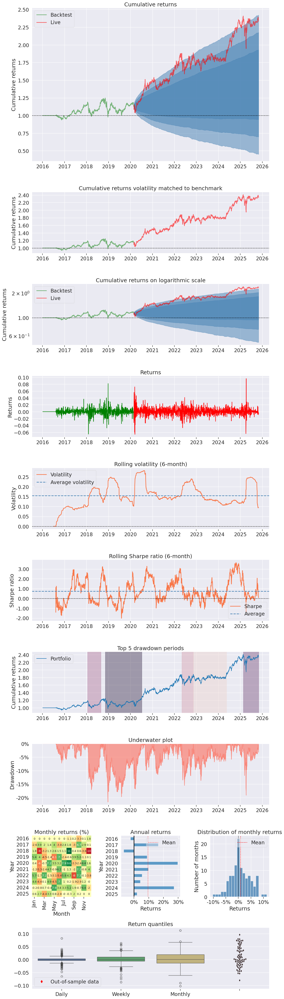

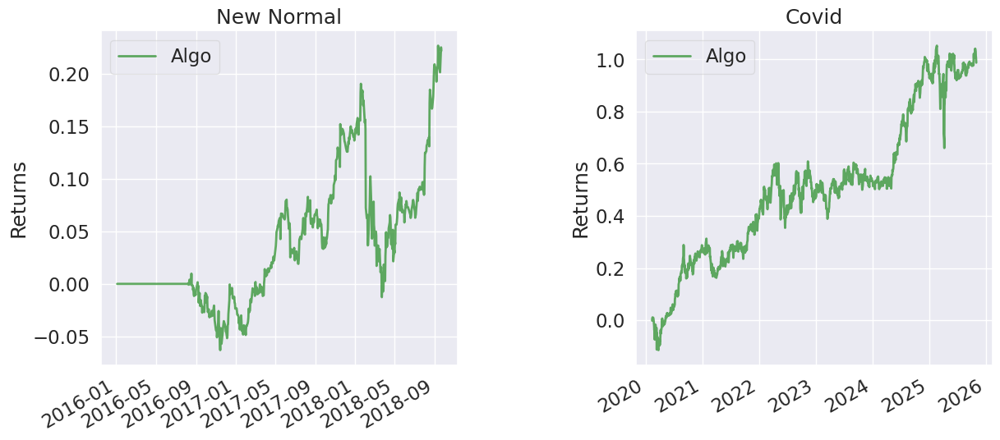

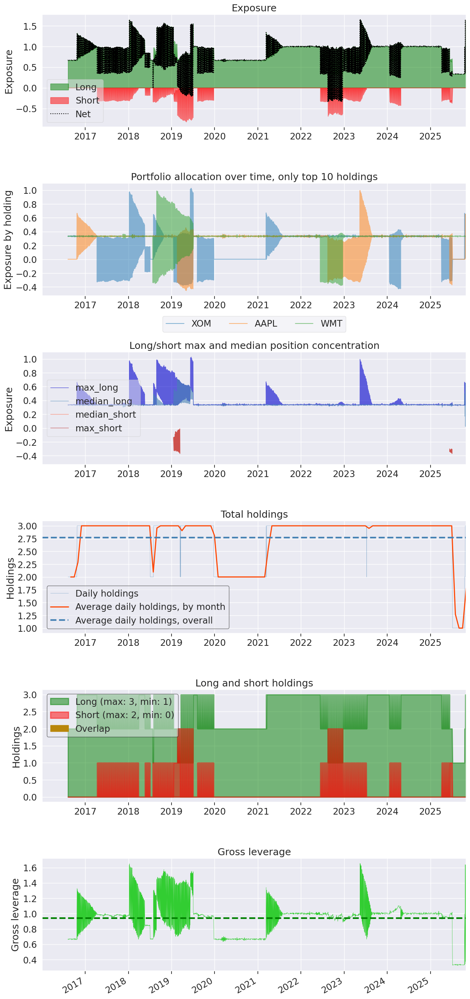

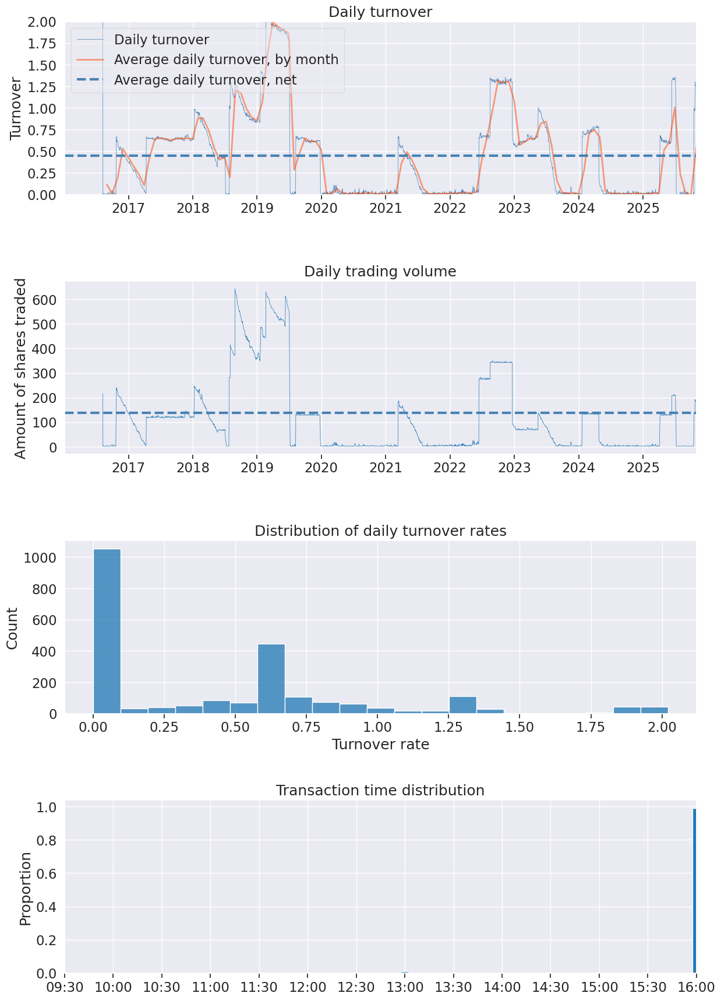

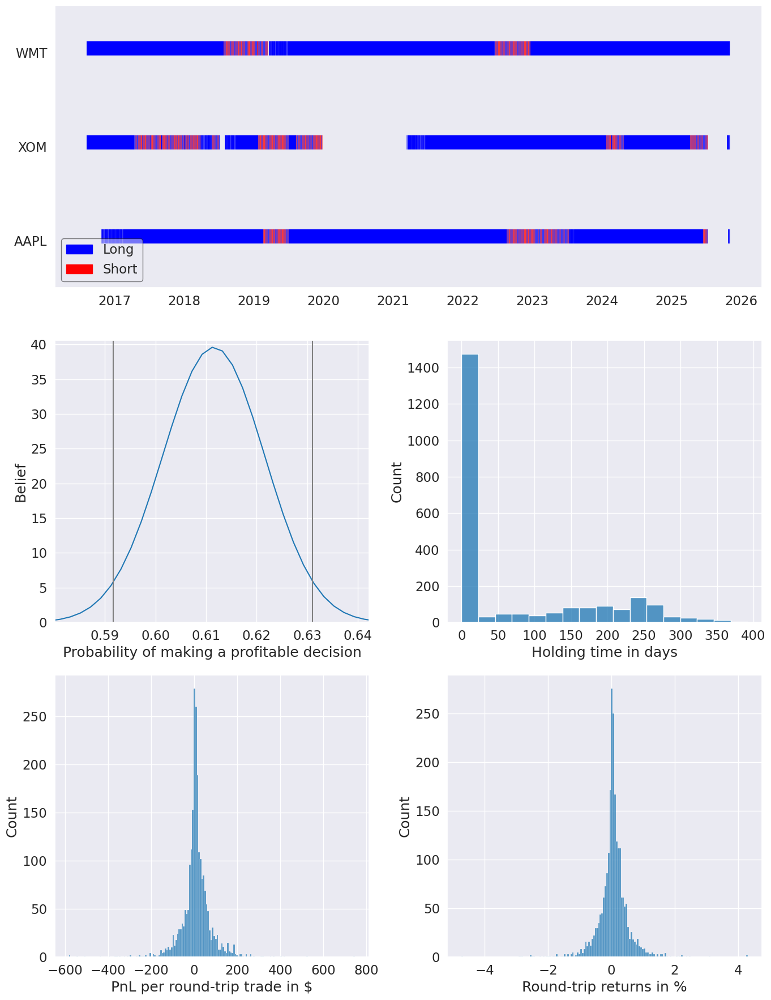

In [25]:
algo2_dma_results = run_algorithm(start=start, end=end,
                        initialize=initialize, analyze=analyze,
                        handle_data=handle_data,
                        capital_base=10000,
                        data_frequency = 'daily', bundle='etf-bundle')

In [26]:
def initialize_mean_reversion(context):

    context.universe = [symbol(s) for s in tickers]
    context.lookback = 20
    context.z_entry = 1.0
    context.z_exit = 0.25
    schedule_function(mean_reversion_rebalance, date_rules.every_day(), time_rules.market_close())

def mean_reversion_rebalance(context, data):
    price_history = data.history(context.universe, 'price', context.lookback, '1d')
    mean_price = price_history.mean()
    std_price = price_history.std()

    for asset in context.universe:
        if not data.can_trade(asset):
            continue

        z_score = (data.current(asset, 'price') - mean_price[asset]) / std_price[asset]
        if z_score < -context.z_entry:
            order_target_percent(asset, 0.25)  # go long
        elif z_score > context.z_entry:
            order_target_percent(asset, -0.25)  # go short
        elif abs(z_score) < context.z_exit:
            order_target_percent(asset, 0)

def analyze(context, perf):
    import matplotlib.pyplot as plt

    fig = plt.figure()
    ax1 = fig.add_subplot(311)
    perf['portfolio_value'].plot(ax=ax1)
    ax1.set_ylabel("Portfolio value (USD)")

    plt.show()
    #Use PyFolio to generate a performance report
    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf)
    pf.create_full_tear_sheet(returns, positions=positions, transactions=transactions,
                          live_start_date=live_start_date, round_trips=True)

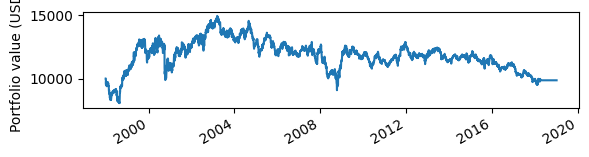

c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2.863%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-1.88%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.067%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  p

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,39.36,2003-03-13,2008-10-09,NaT,NaN
1,26.34,2000-06-27,2000-10-12,2002-03-25,455
2,19.52,1998-01-02,1998-08-21,1998-10-13,203
3,14.28,1999-10-19,1999-12-07,2000-04-28,139
4,9.97,2002-06-05,2002-07-22,2002-08-28,61


c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:850: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  starting_value=is_cum_returns[-1],
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:850: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  starting_value=is_cum_returns[-1],
c:\AJ_MSDS\.venv\Lib\site-packages\matplotlib\dates.py:449: UserWarning: no explicit representation of timezones available for np.datetime64
  d = d.astype('datetime64[us]')
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or u

Stress Events,mean,min,max
Dotcom,-0.00%,-3.68%,2.98%
Lehman,-0.13%,-3.37%,2.61%
9/11,-0.12%,-2.99%,2.66%
US downgrade/European Debt Crisis,0.19%,-3.08%,2.56%
Fukushima,0.07%,-0.63%,1.23%
US Housing,0.06%,-1.84%,2.03%
EZB IR Event,-0.03%,-0.82%,0.82%
Aug07,-0.13%,-3.68%,2.09%
Mar08,-0.23%,-1.89%,1.25%
Sept08,-0.31%,-3.37%,2.61%


Top 10 long positions of all time,max
sid,
AAPL,29.22%
WMT,28.38%
XOM,27.64%


Top 10 short positions of all time,max
sid,
AAPL,-31.20%
XOM,-28.74%
WMT,-28.70%


Top 10 positions of all time,max
sid,
AAPL,31.20%
XOM,28.74%
WMT,28.70%


c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\pos.py:100: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  longs = expos.where(expos.applymap(lambda x: x > 0))
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\pos.py:101: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  shorts = expos.where(expos.applymap(lambda x: x < 0))
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:323: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_holdings_by_month = df_holdings.resample("1M").mean()
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:1465: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_turnover_by_month = df_turnover.resample("M").mean()
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\round_trips.py:317: RuntimeWarning: divide by zero encountered in divide
  ending_price = ending_val / ending_amount
c:\AJ_MSDS\.venv\Li

Summary stats,All trades,Short trades,Long trades
Total number of round_trips,2034.00,1330.00,704.00
Percent profitable,0.43,0.32,0.63
Winning round_trips,870.00,428.00,442.00
Losing round_trips,1164.00,902.00,262.00
Even round_trips,0.00,0.00,0.00


PnL stats,All trades,Short trades,Long trades
Total profit,$-331.16,$-444.28,$113.12
Gross profit,$111328.58,$29710.70,$81617.88
Gross loss,$-111659.74,$-30154.98,$-81504.76
Profit factor,$1.00,$0.99,$1.00
Avg. trade net profit,$-0.16,$-0.33,$0.16
Avg. winning trade,$127.96,$69.42,$184.66
Avg. losing trade,$-95.93,$-33.43,$-311.09
Ratio Avg. Win:Avg. Loss,$1.33,$2.08,$0.59
Largest winning trade,$2210.67,$673.43,$2210.67
Largest losing trade,$-14455.18,$-699.06,$-14455.18


Duration stats,All trades,Short trades,Long trades
Avg duration,30 days 12:37:08.319075712,21 days 14:13:10.375939849,47 days 09:39:48.069602272
Median duration,16 days 00:00:00,16 days 00:00:00,15 days 00:00:00
Longest duration,418 days 00:00:00,186 days 01:00:00,418 days 00:00:00
Shortest duration,0 days 21:00:00,0 days 21:00:00,1 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,-0.02%,-0.01%,-0.03%
Avg returns winning,1.09%,0.59%,1.56%
Avg returns losing,-0.83%,-0.28%,-2.76%
Median returns all round_trips,-0.01%,-0.02%,0.12%
Median returns winning,0.50%,0.38%,0.61%
Median returns losing,-0.06%,-0.05%,-0.24%
Largest winning trade,18.52%,5.73%,18.52%
Largest losing trade,-144.94%,-6.31%,-144.94%


Symbol stats,AAPL,WMT,XOM
Avg returns all round_trips,-0.09%,0.03%,0.01%
Avg returns winning,2.09%,0.58%,0.49%
Avg returns losing,-1.90%,-0.29%,-0.37%
Median returns all round_trips,-0.01%,-0.02%,-0.01%
Median returns winning,0.99%,0.46%,0.24%
Median returns losing,-0.09%,-0.05%,-0.06%
Largest winning trade,18.52%,2.99%,5.73%
Largest losing trade,-144.94%,-4.21%,-12.41%


Profitability (PnL / PnL total) per name,
symbol,
AAPL,1324.83%
XOM,-127.54%
WMT,-1097.29%


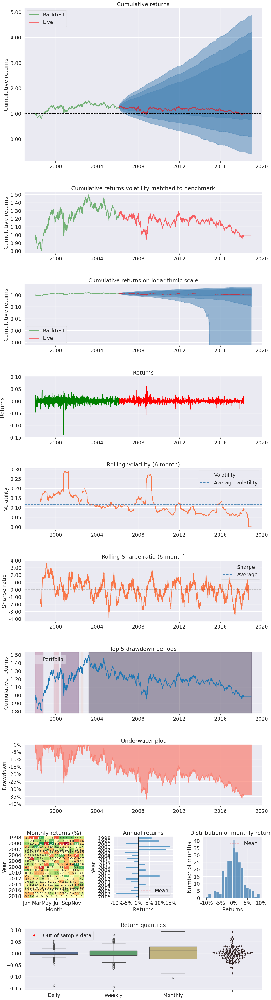

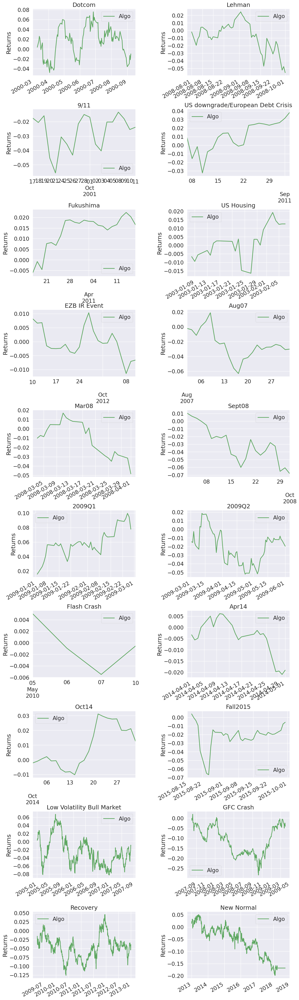

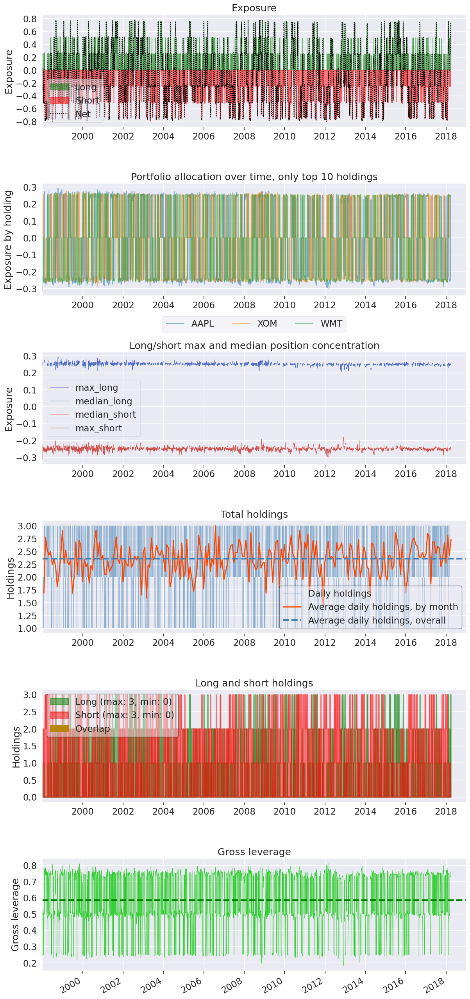

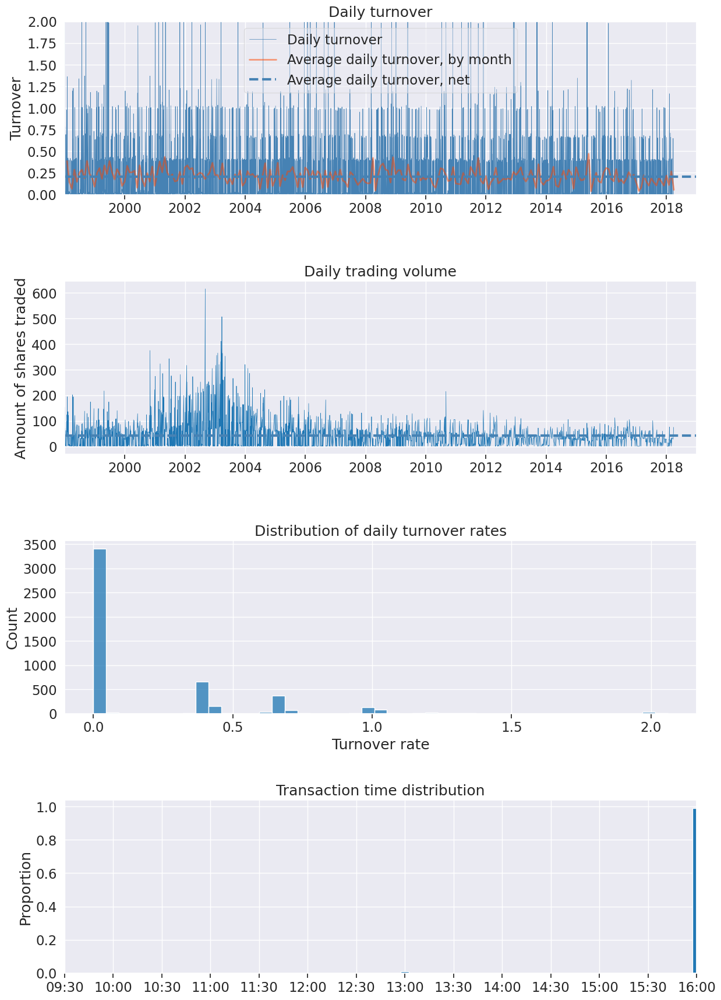

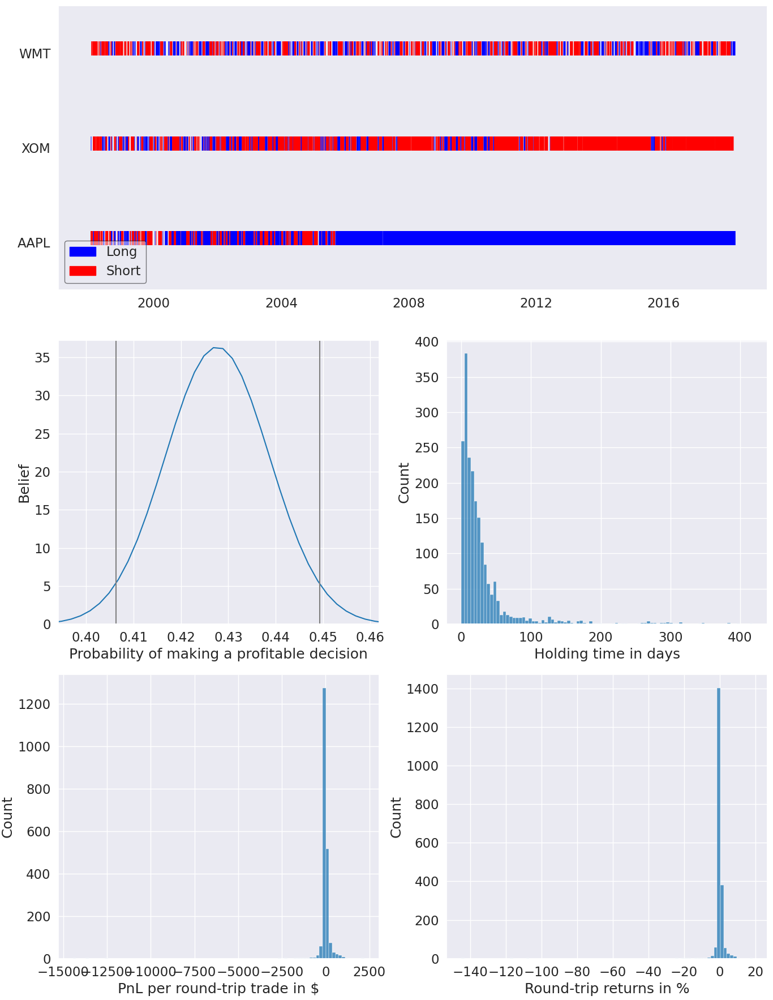

In [ ]:
algo3_mean_rev_results = run_algorithm(
    start=start,
    end=end,
    initialize=initialize_mean_reversion, analyze=analyze,
    capital_base=10000,
    data_frequency='daily',
    bundle='etf-bundle'
)

In [ ]:
def initialize_regime_switch(context):
    context.universe = [symbol(s) for s in tickers]
    context.market_asset = symbol("BRK_A")
    context.vol_lookback = 30
    context.breakout_window = 60
    context.stable_vol = 0.012
    context.breakout_return = 0.04
    context.breakout_buffer = 0.002
    context.crisis_vol = 0.035
    context.crisis_drawdown = -0.15
    context.momentum_lookback = 90
    context.momentum_top_n = 8
    context.momentum_alloc = 1.0
    context.mr_lookback = 20
    context.mr_entry = 1.0
    context.mr_exit = 0.25
    context.mr_long_alloc = 0.45
    context.mr_short_alloc = 0.45
    context.market_history_window = context.vol_lookback + context.breakout_window + 1
    context.min_history = max(
        context.market_history_window,
        context.momentum_lookback + 1,
        context.mr_lookback
    )
    context.regime_codes = {"crisis": -1, "mean_reversion": 0, "momentum": 1}
    context.current_regime = "neutral"

    set_commission(commission.PerShare(cost=0.0075, min_trade_cost=1.0))
    set_slippage(slippage.VolumeShareSlippage())

    schedule_function(regime_rebalance, date_rules.every_day(), time_rules.market_close())


def regime_rebalance(context, data):
    regime, realized_vol, drawdown = detect_regime(context, data)
    if regime is None:
        return

    context.current_regime = regime

    if realized_vol is not None and drawdown is not None:
        record(
            regime_code=context.regime_codes.get(regime, 0),
            realized_vol=realized_vol,
            drawdown=drawdown
        )

    if regime == "crisis":
        liquidate_universe(context, data)
    elif regime == "momentum":
        apply_momentum(context, data)
    else:
        apply_mean_reversion(context, data)


def detect_regime(context, data):
    try:
        prices = data.history(
            context.market_asset,
            "close",
            context.market_history_window,
            "1d"
        ).dropna()
    except Exception:
        return None, None, None

    if len(prices) < context.market_history_window:
        return None, None, None

    recent_returns = prices.pct_change().dropna().iloc[-context.vol_lookback:]
    if recent_returns.empty:
        return None, None, None

    realized_vol = float(recent_returns.std())
    drawdown_window = prices.iloc[-context.vol_lookback:]
    drawdown = float(drawdown_window.iloc[-1] / drawdown_window.max() - 1)
    window_return = float(prices.iloc[-1] / prices.iloc[-context.breakout_window] - 1)
    breakout_high = float(prices.iloc[-context.breakout_window:].max())
    breakout_condition = prices.iloc[-1] >= breakout_high * (1 - context.breakout_buffer)

    if drawdown <= context.crisis_drawdown or realized_vol >= context.crisis_vol:
        return "crisis", realized_vol, drawdown
    if realized_vol <= context.stable_vol:
        return "mean_reversion", realized_vol, drawdown
    if breakout_condition and window_return >= context.breakout_return:
        return "momentum", realized_vol, drawdown
    return "mean_reversion", realized_vol, drawdown


def apply_momentum(context, data):
    try:
        price_history = data.history(
            context.universe,
            "close",
            context.momentum_lookback + 1,
            "1d"
        ).dropna()
    except Exception:
        return

    if len(price_history) < context.momentum_lookback + 1:
        return

    momentum_scores = price_history.iloc[-1] / price_history.iloc[0] - 1
    momentum_scores = momentum_scores.dropna().sort_values(ascending=False)

    if momentum_scores.empty:
        liquidate_universe(context, data)
        return

    selected = momentum_scores.head(context.momentum_top_n)
    target_weights = {}
    if not selected.empty:
        weight = context.momentum_alloc / len(selected)
        for asset in selected.index:
            target_weights[asset] = weight

    apply_target_weights(context, data, target_weights)


def apply_mean_reversion(context, data):
    try:
        price_history = data.history(
            context.universe,
            "close",
            context.mr_lookback,
            "1d"
        ).dropna()
    except Exception:
        return

    if len(price_history) < context.mr_lookback:
        return

    means = price_history.mean()
    stds = price_history.std().replace(0, pd.NA)
    z_scores = ((price_history.iloc[-1] - means) / stds).dropna()

    if z_scores.empty:
        liquidate_universe(context, data)
        return

    long_candidates = z_scores[z_scores <= -context.mr_entry].sort_values()
    short_candidates = z_scores[z_scores >= context.mr_entry].sort_values(ascending=False)
    flat_candidates = z_scores[(z_scores.abs() < context.mr_exit)].index

    target_weights = {}

    if len(long_candidates) > 0 and context.mr_long_alloc > 0:
        weight = context.mr_long_alloc / len(long_candidates)
        for asset in long_candidates.index:
            target_weights[asset] = weight

    if len(short_candidates) > 0 and context.mr_short_alloc > 0:
        weight = context.mr_short_alloc / len(short_candidates)
        for asset in short_candidates.index:
            target_weights[asset] = -weight

    for asset in flat_candidates:
        target_weights.setdefault(asset, 0.0)

    apply_target_weights(context, data, target_weights)


def liquidate_universe(context, data):
    for asset in context.universe:
        if data.can_trade(asset):
            order_target_percent(asset, 0.0)


def apply_target_weights(context, data, target_weights):
    for asset in context.universe:
        weight = target_weights.get(asset, 0.0)
        if data.can_trade(asset):
            order_target_percent(asset, weight)


def handle_data_regime(context, data):
    pass


def analyze_regime(context, perf):
    fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
    perf["portfolio_value"].plot(ax=axes[0], label="Equity Curve", linewidth=2.0)
    axes[0].set_title("Regime-Switching Strategy")
    axes[0].legend()
    axes[0].grid(False)

    if "returns" in perf:
        cumulative = (1.0 + perf["returns"]).cumprod() - 1.0
        cumulative.plot(ax=axes[1], label="Cumulative Return")
        axes[1].set_ylabel("Cumulative Return")
        axes[1].legend()
        axes[1].grid(True)

    plt.tight_layout()

    returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(perf)
    pf.create_full_tear_sheet(returns, positions=positions, transactions=transactions,
                          live_start_date=live_start_date, round_trips=True)




c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-1.38%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-4.798%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-3.487%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,67.48,1999-07-16,2018-01-23,NaT,NaN
1,15.44,1998-01-02,1998-03-19,1998-10-09,201
2,5.12,1999-02-12,1999-03-11,1999-04-21,49
3,5.00,1998-12-11,1998-12-29,1999-01-15,26
4,4.39,1999-04-29,1999-05-04,1999-05-11,9


c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:850: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  starting_value=is_cum_returns[-1],
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:850: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  starting_value=is_cum_returns[-1],
c:\AJ_MSDS\.venv\Lib\site-packages\matplotlib\dates.py:449: UserWarning: no explicit representation of timezones available for np.datetime64
  d = d.astype('datetime64[us]')
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or u

Stress Events,mean,min,max
Dotcom,-0.09%,-3.72%,2.87%
Lehman,-0.22%,-3.28%,2.34%
9/11,0.01%,-3.44%,3.76%
US downgrade/European Debt Crisis,0.22%,-2.23%,1.87%
Fukushima,0.07%,-1.14%,1.19%
US Housing,0.00%,-1.14%,1.21%
EZB IR Event,-0.01%,-0.96%,0.68%
Aug07,0.09%,-1.84%,1.31%
Mar08,-0.29%,-2.16%,2.25%
Sept08,-0.50%,-3.28%,2.34%


Top 10 long positions of all time,max
sid,
XOM,49.12%
AAPL,47.68%
WMT,47.23%


Top 10 short positions of all time,max
sid,
AAPL,-58.56%
XOM,-51.48%
WMT,-50.50%


Top 10 positions of all time,max
sid,
AAPL,58.56%
XOM,51.48%
WMT,50.50%


c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\pos.py:100: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  longs = expos.where(expos.applymap(lambda x: x > 0))
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\pos.py:101: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  shorts = expos.where(expos.applymap(lambda x: x < 0))
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:323: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_holdings_by_month = df_holdings.resample("1M").mean()
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\plotting.py:1465: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_turnover_by_month = df_turnover.resample("M").mean()
c:\AJ_MSDS\.venv\Lib\site-packages\pyfolio\round_trips.py:317: RuntimeWarning: divide by zero encountered in divide
  ending_price = ending_val / ending_amount
c:\AJ_MSDS\.venv\Li

Summary stats,All trades,Short trades,Long trades
Total number of round_trips,3331.00,1903.00,1428.00
Percent profitable,0.51,0.43,0.61
Winning round_trips,1693.00,817.00,876.00
Losing round_trips,1638.00,1086.00,552.00
Even round_trips,0.00,0.00,0.00


PnL stats,All trades,Short trades,Long trades
Total profit,$-2849.15,$-3464.64,$615.49
Gross profit,$121297.72,$39253.74,$82043.98
Gross loss,$-124146.87,$-42718.38,$-81428.50
Profit factor,$0.98,$0.92,$1.01
Avg. trade net profit,$-0.86,$-1.82,$0.43
Avg. winning trade,$71.65,$48.05,$93.66
Avg. losing trade,$-75.79,$-39.34,$-147.52
Ratio Avg. Win:Avg. Loss,$0.95,$1.22,$0.63
Largest winning trade,$1338.90,$1338.90,$889.30
Largest losing trade,$-12637.90,$-712.75,$-12637.90


Duration stats,All trades,Short trades,Long trades
Avg duration,20 days 04:51:43.933053137,13 days 22:24:09.080399369,28 days 13:22:11.093137255
Median duration,8 days 03:00:00,8 days 00:00:00,9 days 00:00:00
Longest duration,288 days 00:00:00,178 days 00:00:00,288 days 00:00:00
Shortest duration,0 days 21:00:00,0 days 21:00:00,1 days 00:00:00


Return stats,All trades,Short trades,Long trades
Avg returns all round_trips,-0.03%,-0.02%,-0.04%
Avg returns winning,0.96%,0.56%,1.33%
Avg returns losing,-1.03%,-0.44%,-2.26%
Median returns all round_trips,0.00%,-0.02%,0.13%
Median returns winning,0.46%,0.33%,0.67%
Median returns losing,-0.22%,-0.20%,-0.28%
Largest winning trade,15.00%,11.58%,15.00%
Largest losing trade,-231.72%,-5.84%,-231.72%


Symbol stats,AAPL,WMT,XOM
Avg returns all round_trips,-0.11%,0.03%,0.01%
Avg returns winning,1.61%,0.43%,0.60%
Avg returns losing,-2.46%,-0.29%,-0.54%
Median returns all round_trips,0.10%,-0.01%,-0.01%
Median returns winning,0.93%,0.25%,0.39%
Median returns losing,-0.32%,-0.14%,-0.25%
Largest winning trade,15.00%,3.12%,4.08%
Largest losing trade,-231.72%,-2.92%,-22.41%


Profitability (PnL / PnL total) per name,
symbol,
AAPL,218.80%
XOM,39.79%
WMT,-158.59%


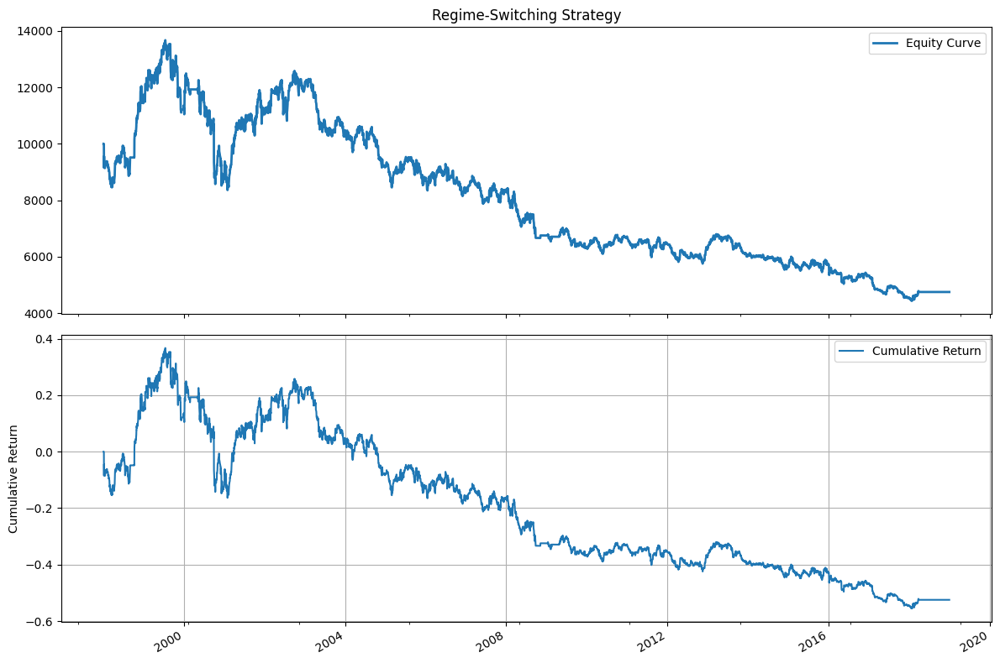

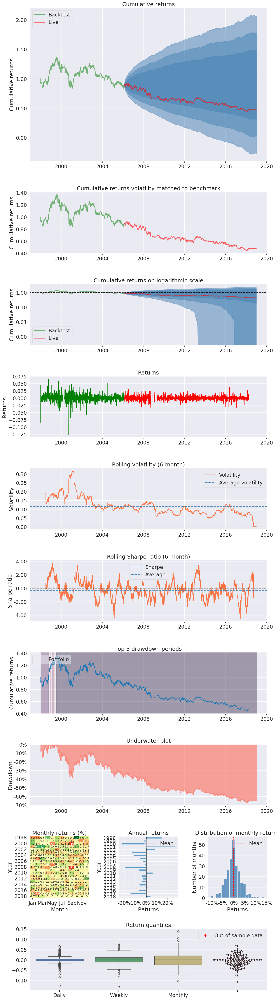

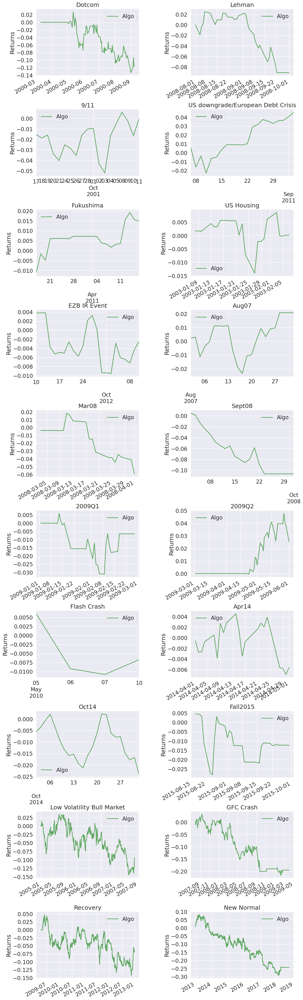

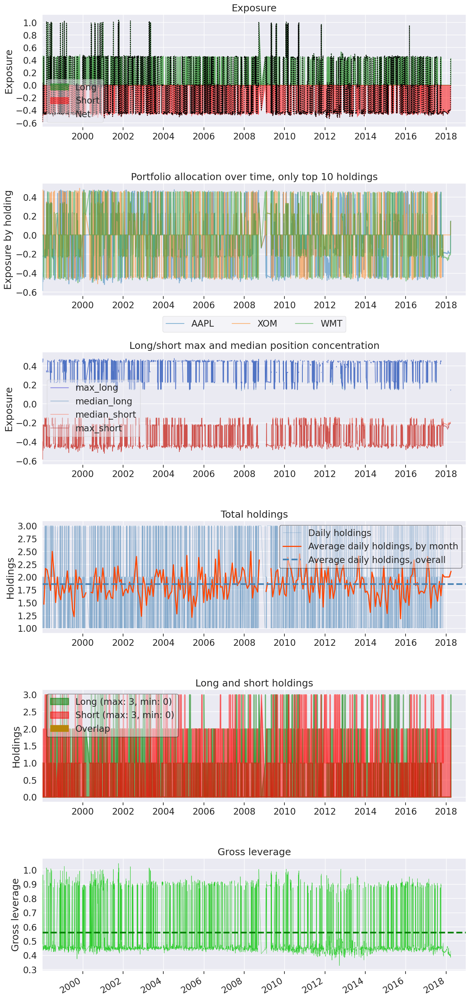

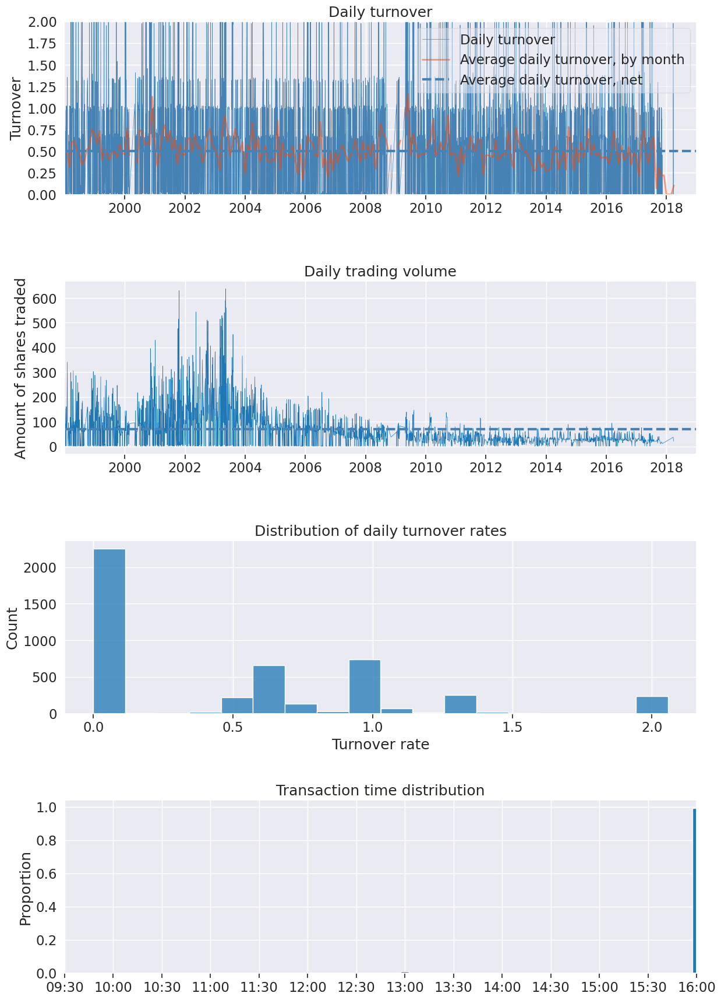

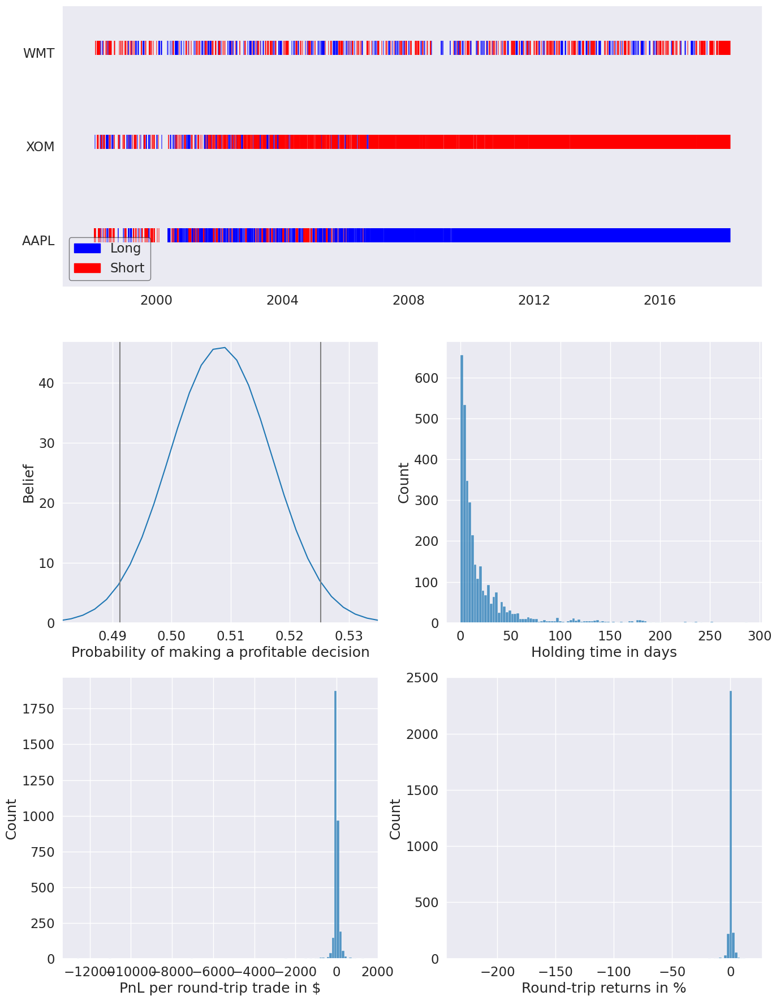

In [ ]:
algo4_regime_results = run_algorithm(
    start=start,
    end=end,
    initialize=initialize_regime_switch,
    handle_data=handle_data_regime,
    analyze=analyze_regime,
    capital_base=10000,
    data_frequency="daily",
    bundle="quandl"
)

In [ ]:
import numpy as np
import yfinance as yf
import empyrical as ep

def sanitize_series(series):
    series = series.copy()
    if getattr(series.index, "tz", None) is not None:
        series.index = series.index.tz_convert("UTC").tz_localize(None)
    return series.sort_index().dropna()

strategy_returns = {
    "Monthly_Momentum": sanitize_series(algo1_momentum_results["returns"]),
    "Dual_MA": sanitize_series(algo2_dma_results["returns"]),
    "Mean_Reversion": sanitize_series(algo3_mean_rev_results["returns"]),
    "Regime_Switching": sanitize_series(algo4_regime_results["returns"]),
}

start_date = min(s.index.min() for s in strategy_returns.values())
end_date = max(s.index.max() for s in strategy_returns.values()) + pd.Timedelta(days=1)
bench_tickers = ["SPY", "QQQ", "IEF", "BRK-A"]
bench_prices = yf.download(bench_tickers, start=start_date, end=end_date, auto_adjust=True, progress=False)["Close"]
bench_returns = bench_prices.pct_change().dropna()

def summarize(returns, benchmark):
    aligned = returns.reindex(benchmark.index, method="ffill").dropna()
    bench_aligned = benchmark.loc[aligned.index]
    cumulative = (1 + aligned).prod() - 1
    ann_return = ep.annual_return(aligned)
    ann_vol = ep.annual_volatility(aligned)
    sharpe = ep.sharpe_ratio(aligned)
    mdd = ep.max_drawdown(aligned)
    alpha, beta = ep.alpha_beta(aligned, bench_aligned)
    return pd.Series(
        {
            "Cumulative Return": cumulative,
            "Annual Return": ann_return,
            "Annual Volatility": ann_vol,
            "Sharpe": sharpe,
            "Max Drawdown": mdd,
            "Alpha_vs_SPY": alpha,
            "Beta_vs_SPY": beta,
        }
    )

summary_rows = []
for name, series in strategy_returns.items():
    summary_rows.append(summarize(series, bench_returns["SPY"]))

for ticker in bench_tickers:
    summary_rows.append(
        summarize(
            bench_returns[ticker],
            bench_returns["SPY"],
        ).rename(index=lambda x: x if not x.startswith("Alpha") else x.replace("_vs_SPY", ""))
    )

comparison_df = pd.DataFrame(summary_rows, index=list(strategy_returns.keys()) + bench_tickers)
display(comparison_df.style.format("{:.2%}", subset=["Cumulative Return", "Annual Return", "Annual Volatility", "Max Drawdown"])
                       .format("{:.2f}", subset=["Sharpe", "Alpha_vs_SPY", "Beta_vs_SPY"])
                       .set_caption("Strategy vs Benchmark Performance (Daily Returns)"))
# ...existing code...

,Cumulative Return,Annual Return,Annual Volatility,Sharpe,Max Drawdown,Alpha_vs_SPY,Beta_vs_SPY,Alpha
Monthly_Momentum,113.21%,4.72%,5.71%,0.84,-11.66%,0.02,0.24,nan
Dual_MA,292.02%,8.68%,16.80%,0.58,-28.03%,0.06,0.44,nan
Mean_Reversion,-25.10%,-1.75%,10.54%,-0.11,-39.36%,-0.02,0.10,nan
Regime_Switching,-58.81%,-5.26%,9.60%,-0.52,-64.65%,-0.05,0.02,nan
SPY,280.93%,8.49%,18.54%,0.53,-55.19%,nan,1.00,0.000000
QQQ,619.01%,12.78%,21.12%,0.68,-53.40%,nan,1.03,0.041955
IEF,115.15%,4.78%,6.61%,0.74,-10.40%,nan,-0.14,0.065040
BRK-A,336.52%,9.40%,20.73%,0.54,-51.47%,nan,0.65,0.048488


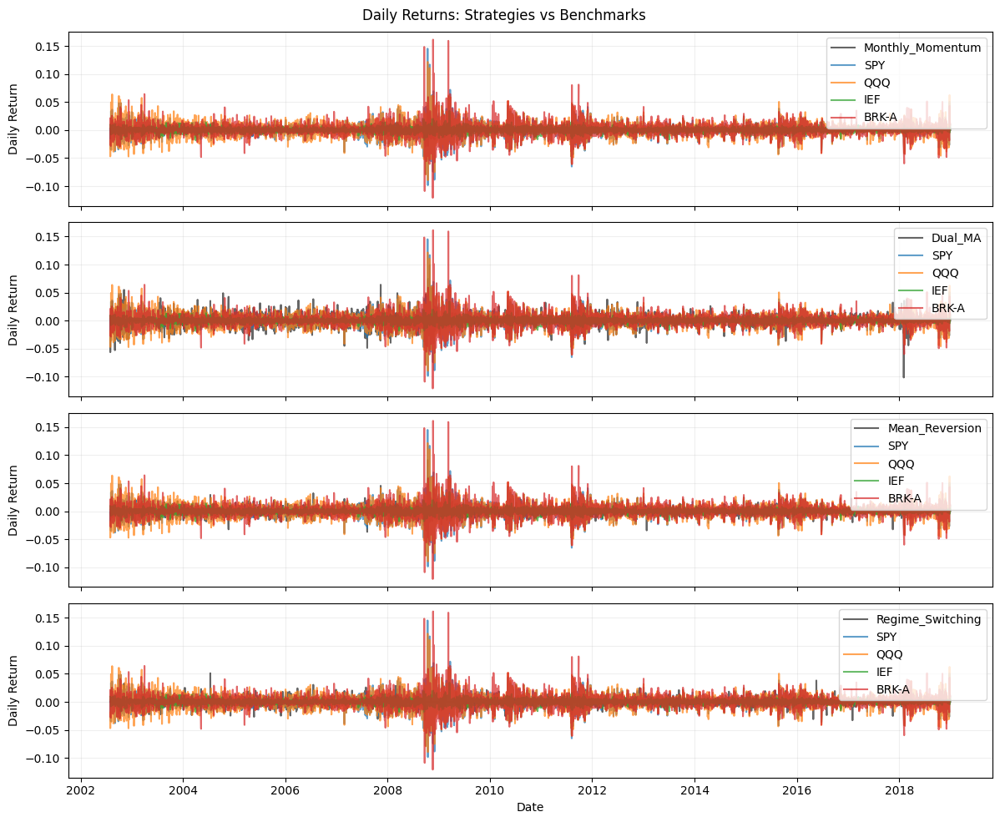

In [ ]:
fig, axes = plt.subplots(len(strategy_returns), 1, figsize=(12, 10), sharex=True)

for ax, (name, series) in zip(axes, strategy_returns.items()):
    aligned = series.align(bench_returns, join="inner")[0]
    ax.plot(aligned.index, aligned, label=name, color="black", alpha=0.6)
    ax.plot(bench_returns.index, bench_returns["SPY"], label="SPY", alpha=0.7)
    ax.plot(bench_returns.index, bench_returns["QQQ"], label="QQQ", alpha=0.7)
    ax.plot(bench_returns.index, bench_returns["IEF"], label="IEF", alpha=0.7)
    ax.plot(bench_returns.index, bench_returns["BRK-A"], label="BRK-A", alpha=0.7)
    ax.set_ylabel("Daily Return")
    ax.legend(loc="upper right")
    ax.grid(True, alpha=0.2)

axes[-1].set_xlabel("Date")
plt.suptitle("Daily Returns: Strategies vs Benchmarks")
plt.tight_layout()
plt.show()

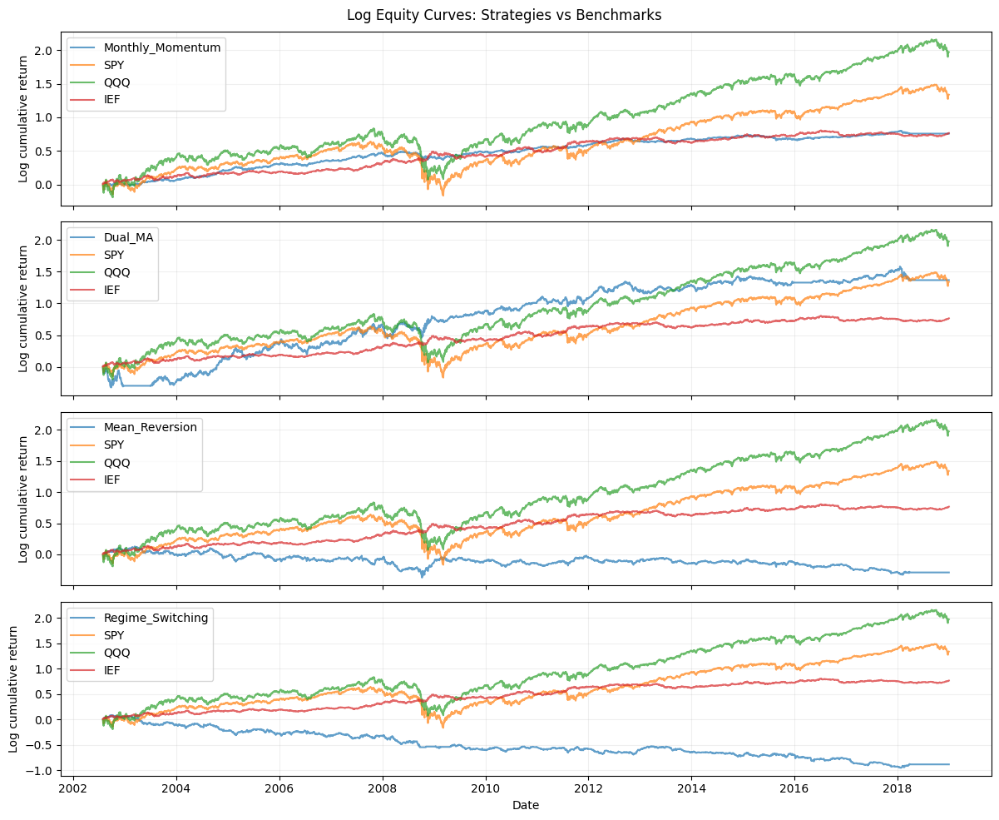

In [ ]:
fig, axes = plt.subplots(len(strategy_returns), 1, figsize=(12, 10), sharex=True)

for ax, (name, series) in zip(axes, strategy_returns.items()):
    combined = pd.concat(
        [series, bench_returns["SPY"], bench_returns["QQQ"], bench_returns["IEF"], bench_returns["BRK-A"]],
        axis=1,
        keys=[name, "SPY", "QQQ", "IEF", "BRK-A"]
    ).dropna()
    log_curves = np.log1p(combined).cumsum()

    for label in log_curves.columns:
        ax.plot(log_curves.index, log_curves[label], label=label, alpha=0.7)

    ax.set_ylabel("Log cumulative return")
    ax.legend(loc="upper left")
    ax.grid(True, alpha=0.2)

axes[-1].set_xlabel("Date")
plt.suptitle("Log Equity Curves: Strategies vs Benchmarks")
plt.tight_layout()
plt.show()